# 🚨 911 Calls Data Analysis: A Real-World Case Study 

# 1. Project Overview 

# Title: Analyzing 911 Emergency Call Data to Extract Operational Insights
### Data source: [Kaggle 911 Dataset](https://www.kaggle.com/datasets/mchirico/montcoalert)
### Dataset Author: Mike Chirico

# • Objective :
### To explore, analyze, and derive actionable insights from 911 emergency call data to help public safety departments optimize emergency response strategies, resource allocation, and community safety programs.

# • Context:
### This dataset contains over 600,000 emergency calls from Montgomery County, PA. It includes information such as the time, location, and type of emergency. Our goal is to uncover trends in call volume, emergency types, and their temporal and spatial distributions.    

## • Problem Statement:
### What are the most common reasons for 911 calls? How do these calls vary by time and location? What operational insights can be drawn to improve emergency response planning?

## • Value:
### A data-driven summary can support better staffing, resource planning, and public safety policy.


---

# 2. DATA EXPLORATION & UNDERSTANDING


In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import folium
from folium.plugins import HeatMap
warnings.filterwarnings('ignore')
%matplotlib inline

## *Set consistent visual style*

In [3]:
sns.set_style('whitegrid')

## *Load dataset*

In [4]:
# df = DataFrame
df = pd.read_csv('911.csv')

### *Inspect dataset*


In [5]:
# General info about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663522 entries, 0 to 663521
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   lat        663522 non-null  float64
 1   lng        663522 non-null  float64
 2   desc       663522 non-null  object 
 3   zip        583323 non-null  float64
 4   title      663522 non-null  object 
 5   timeStamp  663522 non-null  object 
 6   twp        663229 non-null  object 
 7   addr       663522 non-null  object 
 8   e          663522 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 45.6+ MB


In [6]:
# The first 5 rows of the dataset
df.head(5)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:10:52,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:29:21,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 14:39:21,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 16:47:36,NORRISTOWN,AIRY ST & SWEDE ST,1
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 16:56:52,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1


### • *Feature descriptions (inferred from data):*
 - lat, lng: Geographic location of the call
 - desc: Full description of the emergency
 - zip: Zip code where the call was placed
 - title: Type and sub-type of emergency (e.g., EMS: BACK PAINS/INJURY)
 - timeStamp: When the call occurred
 - twp: Township or jurisdiction
 - addr: Address
 - e: Unknown constant (always 1) (will be dropped)

In [7]:
# Check missing values
df.isna().sum()

lat              0
lng              0
desc             0
zip          80199
title            0
timeStamp        0
twp            293
addr             0
e                0
dtype: int64

In [79]:
# Top 5 zip codes by number of calls
df['zip'].value_counts().head(5)

zip
19401.0    45606
19464.0    43910
19403.0    34888
19446.0    32270
19406.0    22464
Name: count, dtype: int64

In [33]:
# Top 5 townships
df['twp'].value_counts().head(5)

twp
LOWER MERION    55490
ABINGTON        39947
NORRISTOWN      37633
UPPER MERION    36010
CHELTENHAM      30574
Name: count, dtype: int64

In [34]:
# Number of unique emergency types
df['title'].nunique()

148

# 3. DATA CLEANING AND PREPROCESSING


In [17]:
# Convert timeStamp to datetime
df['timeStamp'] = pd.to_datetime(df['timeStamp'])

In [18]:
df['timeStamp']

0        2015-12-10 17:10:52
1        2015-12-10 17:29:21
2        2015-12-10 14:39:21
3        2015-12-10 16:47:36
4        2015-12-10 16:56:52
                 ...        
663517   2020-07-29 15:46:51
663518   2020-07-29 15:52:19
663519   2020-07-29 15:52:52
663520   2020-07-29 15:54:08
663521   2020-07-29 15:52:46
Name: timeStamp, Length: 663522, dtype: datetime64[ns]

In [25]:
# Extract features from timeStamp

#Extract Hour
df['Hour']  = df['timeStamp'].apply(lambda time: time.hour) 

In [20]:
df['Hour']

0         17
1         17
2         14
3         16
4         16
          ..
663517    15
663518    15
663519    15
663520    15
663521    15
Name: Hour, Length: 663522, dtype: int64

In [26]:
#Extract Month
df['Month'] = df['timeStamp'].apply(lambda time: time.month)

In [23]:
df['Month']

0         12
1         12
2         12
3         12
4         12
          ..
663517     7
663518     7
663519     7
663520     7
663521     7
Name: Month, Length: 663522, dtype: int64

In [69]:
#Extract Day of Week
df['Day of Week'] = df['timeStamp'].apply(lambda time: time.dayofweek)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

In [70]:
df['Day of Week']

0         3
1         3
2         3
3         3
4         3
         ..
663517    2
663518    2
663519    2
663520    2
663521    2
Name: Day of Week, Length: 663522, dtype: int64

In [71]:
#Map day of week to names
day_map = {0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
df['Day of Week'] = df['Day of Week'].map(day_map)

In [72]:
df['Day of Week']

0         Thu
1         Thu
2         Thu
3         Thu
4         Thu
         ... 
663517    Wed
663518    Wed
663519    Wed
663520    Wed
663521    Wed
Name: Day of Week, Length: 663522, dtype: object

# 4. EXPLORATORY DATA ANALYSIS

In [34]:
# Extract the reason from the title: EMS: BACK PAINS/INJURY -> EMS is the reason
df['Reason'] = df['title'].apply(lambda str: str.split(':')[0])

Text(0.5, 1.0, 'Count of 911 Calls by Reason')

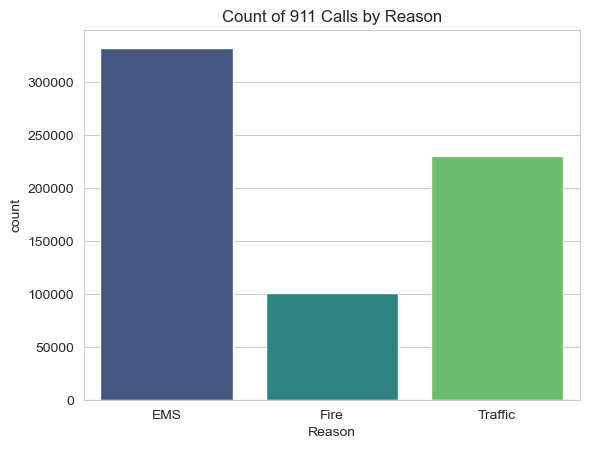

In [39]:
# Count of 911 calls by Reason
sns.countplot(x='Reason', data=df, palette='viridis')
plt.title('Count of 911 Calls by Reason')

Text(0.5, 1.0, '911 Calls by Day of Week')

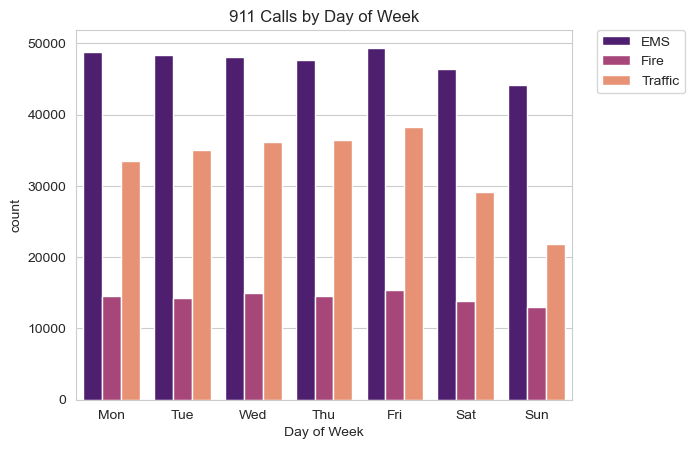

In [77]:
# Count by day of week and reason
day_order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
sns.countplot(x='Day of Week', data=df, hue='Reason', palette='magma', order=day_order)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title('911 Calls by Day of Week')

Text(0.5, 1.0, '911 Calls by Month')

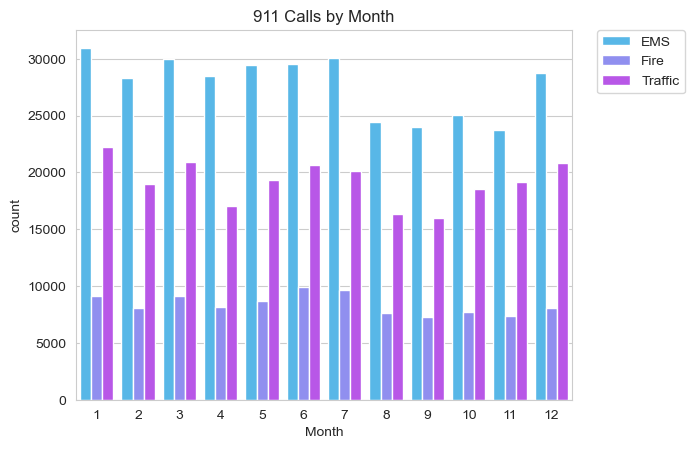

In [78]:
# Count by month and reason
sns.countplot(x='Month', data=df, hue='Reason', palette='cool')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.title('911 Calls by Month')

Text(0, 0.5, 'Calls')

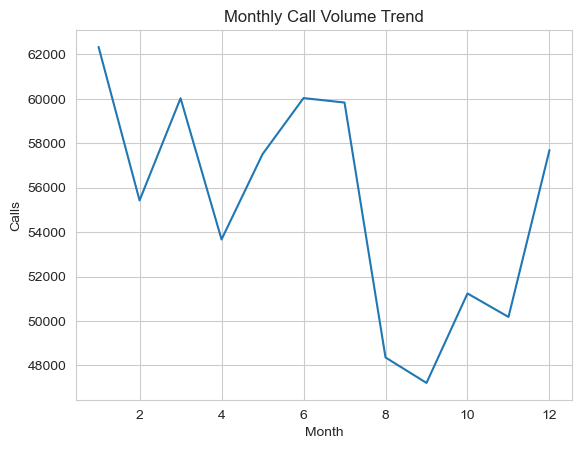

In [82]:
#Group by Month and cound calls

by_month = df.groupby('Month').count()
by_month['lat'].plot()
plt.title('Monthly Call Volume Trend')
plt.xlabel('Month')
plt.ylabel("Calls")

In [85]:
#Create a date column
df['Date'] = df['timeStamp'].apply(lambda time: time.date())

In [86]:
df['Date']

0         2015-12-10
1         2015-12-10
2         2015-12-10
3         2015-12-10
4         2015-12-10
             ...    
663517    2020-07-29
663518    2020-07-29
663519    2020-07-29
663520    2020-07-29
663521    2020-07-29
Name: Date, Length: 663522, dtype: object

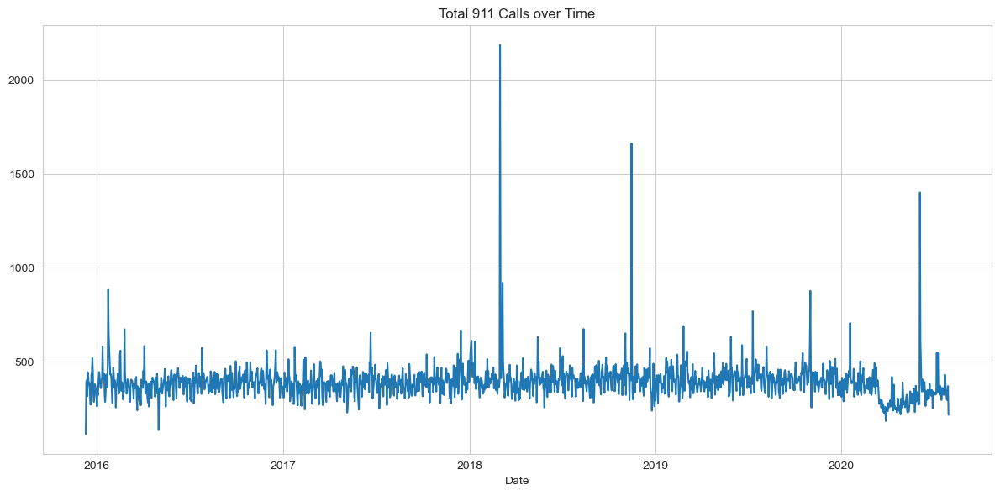

In [92]:
# Plot call volume over time
calls_by_date = df.groupby('Date').count()['lat']
calls_by_date.plot(figsize=(12,6))
plt.title('Total 911 Calls over Time')
plt.tight_layout()

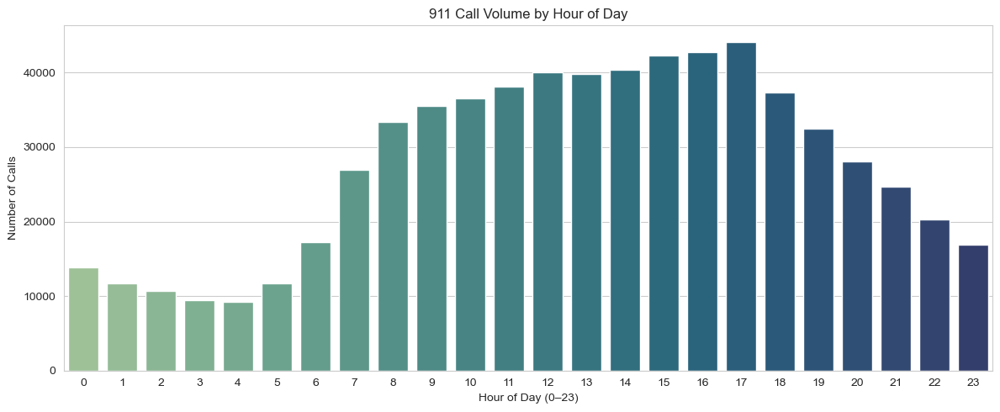

In [103]:
# Plot calls by Hour of Day
plt.figure(figsize=(12,5))
sns.countplot(x='Hour', data=df,palette='crest')
plt.title("911 Call Volume by Hour of Day")
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Number of Calls")
plt.tight_layout()

# 5. INTERACTIVE MAPPING: VISUALIZE EMERGENCY HOTSPOTS

In [99]:
# Filter out rows with invalid lat/lng
heat_df = df[['lat', 'lng']].dropna()

In [101]:
m = folium.Map(location=[df['lat'].median(), df['lng'].median()], zoom_start=10)
HeatMap(data=heat_df.values, radius=10, blur=15).add_to(m)
m

# 6. SUMMARY & RECOMMENDATIONS

## - EMS is the most frequent call reason
## - Most calls occur during business hours (8am–6pm)
## - Busiest days: weekdays, especially Wed & Fri
## - Townships like NORRISTOWN and LOWER MERION account for many calls